# **Project Deep Learning**

In [ ]:
student_name_1 = "Salvador Robles Herrera"
student_name_2 = "Enrique Bencomo Basoco"
student_name_3 = "Michael Castaneda"
student_id_1 = "80683116"
student_id_2 = "80694579"
student_id_3 = "88800919"

## **Introduction**

The project that we will be working on for this Deep Learning class will be the Tabular Playground Competition found in Kaggle thorugh this link: https://www.kaggle.com/competitions/tabular-playground-series-oct-2022/overview.

The input for this problem is a snapshot of the status of a Rocket League match and the output will be the probability of each team to score within the next 10 seconds of the game.

The whole team decided to tackle this problem since we have vast experience in playing with Rocket League and we thought this interest of the game could help us throughout the project. 

Unfortunately we thought that by "snapshot" it meant that our input will be screenshots or images of different moments in time of a match, but no. By snapshots it meant by the current state of certaing elements in the game, for example the ball position and velocity at a certain point in time.


In this project we are going to try and predict this outputs using our Deep Learning knowledge. After setting up the data that we are going to be working on we will do some Data Analysis and then follow that with some processing before the creation of the model. We will try experimenting with different approaches when creating our prediction models and then we will choose our best models and submit it through Kaggle.

## **Set Up**

This section downloads the necessary data to work on the Tabular Playground Competition. The data is in forms of CSV files, so this section will also transform them.

In [ ]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import plotly.graph_objs as plotly  # for interactive plots
import plotly.express as px 
import tensorflow as tf
from tensorflow import keras
from keras import metrics

In [ ]:
# Upload kaggle json file with token
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"enriquebencomo","key":"e644555c713d7f086a006f1b339f552c"}'}

In [ ]:
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle
! chmod 600 ~/.kaggle/kaggle.json
! pip install kaggle

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
! kaggle competitions download -c tabular-playground-series-oct-2022

100% 3.47G/3.49G [00:40<00:00, 141MB/s]
100% 3.49G/3.49G [00:40<00:00, 93.0MB/s]


In [ ]:
! unzip \*.zip && rm *.zip

Archive:  tabular-playground-series-oct-2022.zip
  inflating: sample_submission.csv   
  inflating: test.csv                
  inflating: test_dtypes.csv         
  inflating: train_0.csv             
  inflating: train_1.csv             
  inflating: train_2.csv             
  inflating: train_3.csv             
  inflating: train_4.csv             
  inflating: train_5.csv             
  inflating: train_6.csv             
  inflating: train_7.csv             
  inflating: train_8.csv             
  inflating: train_9.csv             
  inflating: train_dtypes.csv        


In order to easily manipulate our data we will transform the CSV files of our training data into Numpy arrays. Only the train_0 file will be used to train since there is a lot of data to handle at the same time.

In [ ]:
def open_csv_file(filename):
  df = pd.read_csv(filename)
  df = df.fillna(0.0)
  return np.array(df.values), df.columns

X_train_0, col = open_csv_file('/content/train_0.csv')

## **Data Analysis**

Before working on the implementation of the problem we will do some analysis in our data to see what valuable information we can gather to build our Deep Learning model.

Some of the analysis that we will be doing:

* Basic shape and analysis
* Average distance between player who scores and ball.
* Average velocity of the ball
* Average velocity of all players
* Average time remaining for each of the 6 boosts, and therefore, which are the most consumed.
* Players plot. Representation of how the cars are placed within the field.

### Shape

We will be using the train_0.csv file which has more than 2 million records of data and each record has a total of 61 features. Some of the features we are working with are the position and velocity (in the x,y and z dimension) of the ball and the 6 players.

Here there is a list of features that we are dealing with.

In [ ]:
# Shape of input
print('Number of elements in X_train_0: ', X_train_0.shape[0])
print('Number of features per record: %d\n' % (X_train_0.shape[1]))

# Features
print('Features in data:\n')
for i,ft in enumerate(col):
  print('Feature %d: %s' % (i, ft))

Number of elements in X_train_0:  2149381
Number of features per record: 61

Features in data:

Feature 0: game_num
Feature 1: event_id
Feature 2: event_time
Feature 3: ball_pos_x
Feature 4: ball_pos_y
Feature 5: ball_pos_z
Feature 6: ball_vel_x
Feature 7: ball_vel_y
Feature 8: ball_vel_z
Feature 9: p0_pos_x
Feature 10: p0_pos_y
Feature 11: p0_pos_z
Feature 12: p0_vel_x
Feature 13: p0_vel_y
Feature 14: p0_vel_z
Feature 15: p0_boost
Feature 16: p1_pos_x
Feature 17: p1_pos_y
Feature 18: p1_pos_z
Feature 19: p1_vel_x
Feature 20: p1_vel_y
Feature 21: p1_vel_z
Feature 22: p1_boost
Feature 23: p2_pos_x
Feature 24: p2_pos_y
Feature 25: p2_pos_z
Feature 26: p2_vel_x
Feature 27: p2_vel_y
Feature 28: p2_vel_z
Feature 29: p2_boost
Feature 30: p3_pos_x
Feature 31: p3_pos_y
Feature 32: p3_pos_z
Feature 33: p3_vel_x
Feature 34: p3_vel_y
Feature 35: p3_vel_z
Feature 36: p3_boost
Feature 37: p4_pos_x
Feature 38: p4_pos_y
Feature 39: p4_pos_z
Feature 40: p4_vel_x
Feature 41: p4_vel_y
Feature 42: p4_vel

### Average distance between ball and player who scores next



In [ ]:
# Average distance between player who scores next and ball

def distance_points(coords_1, coords_2):
  return np.sqrt(np.sum((coords_1 - coords_2)**2, axis = 0))

def get_player_coords(X_train, idx, player_num):
  return X_train[idx][9 + (7 * player_num)]

def get_ball_coords(X_train, idx):
  return X_train[idx][3:6]

def avg_dist():
  sum_dist = 0
  for i in range(X_train_0.shape[0]):
    ball_coords = get_ball_coords(X_train_0, i)
    to_score_player = X_train_0[i][57]
    player_coords = get_player_coords(X_train_0, i, to_score_player)
    dist = distance_points(ball_coords, player_coords)
    sum_dist = abs(dist)
  avg = sum_dist / X_train_0.shape[0]
  print('Average distance between player next to score and ball: ', avg)

avg_dist()

Average distance between player next to score and ball:  2.473826520764966e-05


### Average velocity of Ball

In [ ]:
# Average velocity of ball. Note that there is x, y and z axis

def get_avg_vel(X_train, idx):
  return np.nansum(np.absolute(X_train[:,idx:idx+3]), axis = 0)/ X_train.shape[0]

def avg_vel_ball():
  ball_idx = 6
  vels = get_avg_vel(X_train_0, ball_idx)
  print('Average velocity of ball: ', vels)

avg_vel_ball()

Average velocity of ball:  [18.369455683294163 23.421052909610545 9.427025407743956]


### Average velocity of Players

In [ ]:
# Average velocity of all players
def avg_vel_players():
    idxs = [12,19,26,33,40,47]
    vels = np.array([0.0,0.0,0.0])
    for idx in idxs:
      vels = np.add(get_avg_vel(X_train_0, idx), vels)
    vels /= len(idxs)
    print('Average velocity of all players in the game: ', vels)
avg_vel_players()

Average velocity of all players in the game:  [17.111309083690994 20.274297131083287 3.070095084086366]


### Average time of Boosts

In [ ]:
# Average time remaining for each of the 6 boosts

def avg_boost():
  idxs = [51,52,53,54,55,56] # Index of boost features
  for idx in idxs:
    avg = np.nansum(X_train_0[:,idx]) / X_train_0.shape[0]
    print('Average boost for boost timer %d: %f' % (idx - 50, avg))

avg_boost()

Average boost for boost timer 1: -2.727069
Average boost for boost timer 2: -2.754303
Average boost for boost timer 3: -3.226214
Average boost for boost timer 4: -3.220364
Average boost for boost timer 5: -2.751841
Average boost for boost timer 6: -2.718325


### Players plots

Next, there are two dotplots that represent the state of the game visually where the axis x and y are graphed for the ball and all players on the field. On one of the games the goal is within 10 seconds while in the other is not. Players 0-2 are part of Team A and players 3-5 are from Team B.

In [ ]:
# Plot locations of players and the ball
def plot_game_positions_dotplot(game, title=''):
  Xcoord = []
  Ycoord = []
  colname = []

  # Get ball coordinates
  Xcoord.append(X_train_0[:,3][game])
  Ycoord.append(X_train_0[:,4][game])
  colname.append(col[3][:-2])

  # Get player coordinates
  for i in range(9,46,7):
    Xcoord.append(X_train_0[:,i][game])
    Ycoord.append(X_train_0[:,i+1][game])
    colname.append(col[i][:-2])
    
  data = plotly.Scatter(x=Xcoord, y=Ycoord, text= [i for i in colname],
                        mode='markers', textposition='bottom left',
                        hoverinfo='text')
  fig = plotly.Figure(data=[data],
                      layout=plotly.Layout(title=title,
                                            hovermode='closest'))
  fig.update_xaxes(range=[-120, 120])
  fig.update_yaxes(range=[-82, 82])
  fig.show(renderer="colab")

In [ ]:
plot_game_positions_dotplot(10, title='No team scores within ten seconds')

In [ ]:
plot_game_positions_dotplot(270, title='Team B scores within ten seconds')

### Distribution of goal within 10 seconds

Piechart where sections are: A scores, B scores, No one scores.

In [ ]:
scores_10sec = np.zeros_like(X_train_0[:,-2])
scores_10sec[X_train_0[:,-2] == 1] = 'Team A'
scores_10sec[X_train_0[:,-1] == 1] = 'Team B'
scores_10sec[scores_10sec == 0] = 'None'
fig = px.pie(data_frame=scores_10sec, names=scores_10sec,  title='Distribution of result within 10 seconds')
fig.show()

## **Upload Results**

We will have a function that gets data and will create a csv file. We need this in order to have proper format for our predictions to be validated through Kaggle and be able to participate in the competition.

In [ ]:
def create_csv(data, filename):
  pred = data
  table_header = ['id','team_A_scoring_within_10sec','team_B_scoring_within_10sec']
  id = np.arange(0,len(pred))
  id = id.reshape(len(pred), 1)
  pred = np.concatenate([id, pred],axis=1)

  # Save file as csv
  df = pd.DataFrame(pred)
  print('Columns', list(df.columns))
  df = df.astype({0: int, 1: float, 2: float})
  df.to_csv(filename, index=False, header=table_header, na_rep=0)

## **Baseline Model**

Our first step is creating a baseline to make sure our predictions and models are able to outperform this bottom line, otherwise our models won't be very useful.

For the baseline of the model, we need to calculate the probability of both teams scoring within 10 seconds. Therefore, we count how many times Team A scores and divide it over the total number of games using the train dataset. The same process applied for Team B.

* Number of games where A scores within 10s / total games
* Number of games where B scores within 10s / total games


In [ ]:
base_prob_A = np.sum(X_train_0[:,-2])/X_train_0.shape[0]
base_prob_B = np.sum(X_train_0[:,-1])/X_train_0.shape[0]
print('base_prob_A', base_prob_A)
print('base_prob_B', base_prob_B)

base_prob_A 0.058310741557685675
base_prob_B 0.05575279580493175


The following score corresponds to the baseline model.
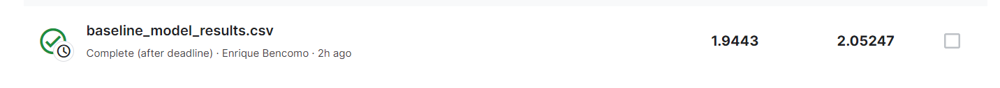

## **Feature Engineering/Data Preprocessing**

For the next step in our project, before creating our models, we need to decide on what features to choose and what features to create. The train dataset contains some extra features that are not contained in the test dataset. Therefore, we will need to use those features to create our output Y. Then, we will remove those columns so that we can feed our model with same features for train and test datasets.

In [ ]:
def obtain_Y(X):
  return X[:, -2:].copy()

def data_preprocessing(X, col):
  # Sort X_train
  indices = np.arange(X.shape[0])
  shuffled_indices = np.random.permutation(indices)
  X = X[shuffled_indices]

  # Obtain Y_train
  Y = obtain_Y(X)

  # Eliminate train-only columns
  X = np.delete(X, [0, 1, 2, 57, 58, 59, 60], 1)
  col = np.delete(col, [0, 1, 2, 57, 58, 59, 60])

  return X, col, Y

X_train_0, col, Y_train_0 = data_preprocessing(X_train_0, col)

In [ ]:
X_test, test_col = open_csv_file('/content/test.csv')
X_test = X_test[:, 1:]

In [ ]:
X_train_0 = np.asarray(X_train_0).astype('float32')
Y_train_0 = np.asarray(Y_train_0).astype('float32')

## **Model 1**

**Outputs.** First of all we decided that our model would produe two outputs. The probability for Team A scoring and the probability of Team B scoring. From here we can derive that our last layer will be a densed layer with activation function sigmoid and, most importantly, two units as outputs. This will make our problem a Regression Task since we want two probabilities. Taking this into account in this model we chose to use as the loss funtion the "mean_squared_logarithmic_error", also since thi type of loss function expects a normally distributed target, which the data seems to be and when the target values varies a lot (here it could be from 0 all the way to 100%). For the metrics we used the "mean_squared_error" since its common within Regresssion tasks like this one.


**Approach.** For this first model of Deep Learning experimentation we tried to take a "densed layer approach". We were thinking that since there is only 55 features per each record than we shouldn't start by adding dense layers that increment the number of units by much. For example to 512 units. We took this approach since we don't want to loose or overamplify our data. I thought it as reasonable to reduce this sice to a number of units like 32. And then reduce this layer units slowly before we only have the two output units. 
Also using the sgd optimizer didn't work as well as the adam optimizer on the number of epochs that we were using in our models. Note that sgd may perform better than the adam optimizer on the longer run with a greater number of epochs.

In [ ]:
def create_NN_model(n_epochs=5):
  # Clear session and remove randomness.
  tf.keras.backend.clear_session()
  tf.random.set_seed(0)

  model = tf.keras.Sequential()
  model.add(tf.keras.layers.Dense(units=32, activation='ReLU'))
  model.add(tf.keras.layers.Dense(units=32, activation='ReLU'))
  model.add(tf.keras.layers.Dense(units=16, activation='ReLU'))
  model.add(tf.keras.layers.Dense(units=16, activation='ReLU'))
  model.add(tf.keras.layers.Dense(
      units=2,                     # We want 2 outputs. The 2 probabilities of each team scoring
      activation='sigmoid'         # apply the sigmoid function!
  ))

  model.compile(loss='mean_squared_logarithmic_error', 
                optimizer='adam',
                metrics=['mean_squared_error'])

  return model

In [ ]:
def plot_history(history):
  plt.ylabel('Loss')
  plt.xlabel('Epoch')
  plt.xticks(range(0, len(history['loss'] + 1)))
  plt.plot(history['loss'], label="training", marker='o')
  plt.plot(history['val_loss'], label="validation", marker='o')
  plt.legend()
  plt.show()

Epoch 1/5
15113/15113 [==============================] - 64s 4ms/step - loss: 0.0256 - mean_squared_error: 0.0535 - val_loss: 0.0239 - val_mean_squared_error: 0.0504
Epoch 2/5
15113/15113 [==============================] - 66s 4ms/step - loss: 0.0237 - mean_squared_error: 0.0498 - val_loss: 0.0235 - val_mean_squared_error: 0.0494
Epoch 3/5
15113/15113 [==============================] - 65s 4ms/step - loss: 0.0235 - mean_squared_error: 0.0493 - val_loss: 0.0234 - val_mean_squared_error: 0.0493
Epoch 4/5
15113/15113 [==============================] - 86s 6ms/step - loss: 0.0234 - mean_squared_error: 0.0490 - val_loss: 0.0234 - val_mean_squared_error: 0.0488
Epoch 5/5
15113/15113 [==============================] - 88s 6ms/step - loss: 0.0233 - mean_squared_error: 0.0488 - val_loss: 0.0235 - val_mean_squared_error: 0.0488


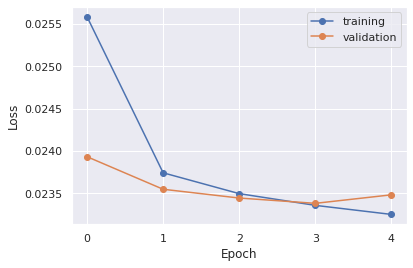

In [ ]:
model1 = create_NN_model()

history = model1.fit(
  x = X_train_0,
  y = Y_train_0,
  epochs=5,             # number of passes through the training data
  batch_size=128,        # mini-batch size
  validation_split=0.1, # use a fraction of the examples for validation
  verbose=1             # display some progress output during training
  )

history = pd.DataFrame(history.history)
plot_history(history)

In [ ]:
Y_pred = model1.predict(X_test)
create_csv(Y_pred, 'model1results.csv')

## **Model 2**

For this model we decided to create a feedfowrad neural network with softmax as the final activation function. We tried to variate some of the units for the learning in order to try and get some better results from the model. We also implemented a few different activation functions to again try and change the learning of the model.

In [ ]:
def build_ffnn_softmax_model(input_shape, learning_rate=0.1):
  """Build a TF feed-forward neural network model using Keras."""
  tf.keras.backend.clear_session()
  tf.random.set_seed(0)

  ffmodel = tf.keras.Sequential()
  ffmodel.add(tf.keras.layers.Flatten(input_shape=input_shape))
  ffmodel.add(tf.keras.layers.Dense(units=128, activation='ReLU'))
  ffmodel.add(tf.keras.layers.Dense(units=256, activation='ReLU'))
  ffmodel.add(tf.keras.layers.Dense(units=128, activation='tanh'))
  ffmodel.add(tf.keras.layers.Dense(units=64, activation='ReLU'))
  ffmodel.add(tf.keras.layers.Dense(units=2, activation='softmax'))

  optimizer = tf.keras.optimizers.SGD(learning_rate=learning_rate)
  ffmodel.compile(loss='mean_squared_logarithmic_error',optimizer='adam',
                metrics=['mean_squared_error'])
  
  return ffmodel

In [ ]:
ffmodel = build_ffnn_softmax_model(X_train_0[0].shape, 0.1)

ffmodel_history = ffmodel.fit(
    x = X_train_0,
    y = Y_train_0,
    epochs=5,
    batch_size=64,
    validation_split=0.1,
    verbose=1
)
ffmodel_history = pd.DataFrame(ffmodel_history.history)
display(ffmodel_history)

Epoch 1/5
30226/30226 [==============================] - 205s 7ms/step - loss: 0.1594 - mean_squared_error: 0.2498 - val_loss: 0.1597 - val_mean_squared_error: 0.2500
Epoch 2/5
30226/30226 [==============================] - 200s 7ms/step - loss: 0.1597 - mean_squared_error: 0.2500 - val_loss: 0.1597 - val_mean_squared_error: 0.2500
Epoch 3/5
30226/30226 [==============================] - 210s 7ms/step - loss: 0.1597 - mean_squared_error: 0.2500 - val_loss: 0.1597 - val_mean_squared_error: 0.2500
Epoch 4/5
30226/30226 [==============================] - 205s 7ms/step - loss: 0.1597 - mean_squared_error: 0.2500 - val_loss: 0.1597 - val_mean_squared_error: 0.2500
Epoch 5/5
30226/30226 [==============================] - 201s 7ms/step - loss: 0.1597 - mean_squared_error: 0.2500 - val_loss: 0.1597 - val_mean_squared_error: 0.2500


,loss,mean_squared_error,val_loss,val_mean_squared_error
0,0.159404,0.249774,0.159749,0.249997
1,0.159747,0.250006,0.159750,0.250007
2,0.159746,0.250007,0.159750,0.250000
3,0.159746,0.250007,0.159749,0.250000
4,0.159746,0.250007,0.159748,0.250000


In [ ]:
ffY_pred = ffmodel.predict(X_test)
create_csv(ffY_pred, 'ffmodelresults.csv')

## **Model 3**

Finally, for the last model, we used our results of the previous models in an attempt to reduce the loss and improve our metrics. We decided to use a different loss function, add layers increasing the units up to 128 and then lowering them back to 2 for the output. We continued using only ReLU for the intermediate layers.

In [ ]:
def create_model(n_epochs=5):
  # Clear session and remove randomness.
  tf.keras.backend.clear_session()
  tf.random.set_seed(0)

  model = tf.keras.Sequential()
  model.add(tf.keras.layers.Dense(units=64, activation='ReLU'))
  model.add(tf.keras.layers.Dense(units=128, activation='ReLU'))
  model.add(tf.keras.layers.Dense(units=128, activation='ReLU'))
  model.add(tf.keras.layers.Dense(units=64, activation='ReLU'))
  model.add(tf.keras.layers.Dense(units=32, activation='ReLU'))
  model.add(tf.keras.layers.Dense(units=16, activation='ReLU'))
  model.add(tf.keras.layers.Dense(units=2, activation='sigmoid'))

  model.compile(loss='mean_squared_error', 
                optimizer='adam',
                metrics=['mean_squared_error'])

  return model

Epoch 1/5
15113/15113 [==============================] - 82s 5ms/step - loss: 0.0500 - mean_squared_error: 0.0500 - val_loss: 0.0481 - val_mean_squared_error: 0.0481
Epoch 2/5
15113/15113 [==============================] - 81s 5ms/step - loss: 0.0475 - mean_squared_error: 0.0475 - val_loss: 0.0471 - val_mean_squared_error: 0.0471
Epoch 3/5
15113/15113 [==============================] - 83s 6ms/step - loss: 0.0459 - mean_squared_error: 0.0459 - val_loss: 0.0453 - val_mean_squared_error: 0.0453
Epoch 4/5
15113/15113 [==============================] - 80s 5ms/step - loss: 0.0444 - mean_squared_error: 0.0444 - val_loss: 0.0440 - val_mean_squared_error: 0.0440
Epoch 5/5
15113/15113 [==============================] - 79s 5ms/step - loss: 0.0433 - mean_squared_error: 0.0433 - val_loss: 0.0432 - val_mean_squared_error: 0.0432


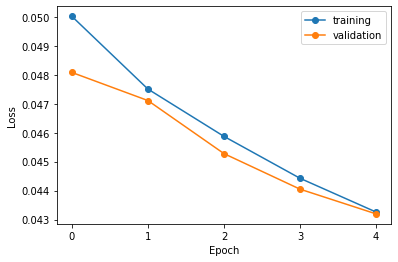

In [ ]:
model3 = create_model()

history = model3.fit(
  x = X_train_0,
  y = Y_train_0,
  epochs=5,
  batch_size=128,
  validation_split=0.1,
  verbose=1
  )

history = pd.DataFrame(history.history)
plot_history(history)

In [ ]:
m3_pred = model3.predict(X_test)
create_csv(m3_pred, 'model3_results.csv')

## **Final Results**

### Model 1

After looking at how the model was performing under our testing data. It seemed like we could have done better by increasing the number of epochs that the model was doing, but by looking at the results of the first 5 epochs than we can see that the our metric, the Mean Squared Error was getting lower which was a sign that the model was learning.

Thanks to the plot we can see that the validation and training losses are very similar, so there is no overfitting and the model can generalize well and work with other examples of data.

The next image shows how our model performed by submitting our predictions to Kaggle. The model greatly outperforms the baseline we did at the begining and is doing good overall in the competition just with 5 epochs.

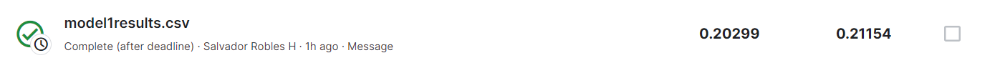

### Model 2


In the end, although this model may have not had the best performance, it still performed better than the baseline. The overall mean squared error for validation was better than the training which means the model worked to some extent, it didn't just learn the data. It is noted, that changing the activation functions around and messing with some hyperparameters can definitely change the accuracy/loss, this model started with a pretty high loss using only ReLU as an activation function then with some modifications grew significantly better.

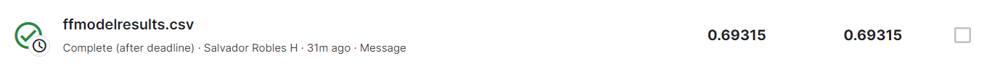

### Model 3

Unfortunately, in our attempts for the third model, the improvements in metrics and loss on our models did not translate into a better score in Kaggle. The first model, provided the best overrall score out of the three neural networks used and its variants. We believe the first model is a good approximation given the fact that we only used one training dataset and the leaderboard indicates a top score of 0.18108.

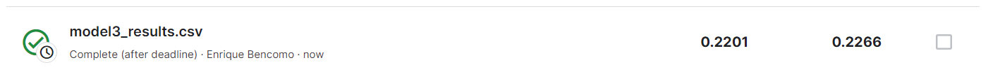